# Desafio 2: Data Visualization & Storytelling

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
dados = ('/content/ceaps_2018_2022.csv')
dataset_ceaps = pd.read_csv(dados)
dataset_ceaps

,ANO,MES,SENADOR,TIPO_DESPESA,CNPJ_CPF,FORNECEDOR,DOCUMENTO,DATA,DETALHAMENTO,VALOR_REEMBOLSADO,COD_DOCUMENTO
0,2018,1,ACIR GURGACZ,"Aluguel de imóveis para escritório político, c...",004.948.028-63,GILBERTO PISELO DO NASCIMENTO,Não informado,2018-01-02,Despesa com pagamento de aluguel de imóvel par...,6000.00,2088462
1,2018,1,ACIR GURGACZ,"Passagens aéreas, aquáticas e terrestres nacio...",63.764.211/0001-10,TRANSCONTINENTAL AGÊNCIA DE VIAGENS LTDA,M2CJMM,2018-01-02,"Companhia Aérea: AVIANCA, Localizador: M2CJMM....",274.99,2088476
2,2018,1,ACIR GURGACZ,"Passagens aéreas, aquáticas e terrestres nacio...",63.764.211/0001-10,TRANSCONTINENTAL AGÊNCIA DE VIAGENS LTDA,SFEXYF,2018-01-02,"Companhia Aérea: LATAM, Localizador: SFEXYF. P...",1094.29,2088528
3,2018,1,ACIR GURGACZ,"Passagens aéreas, aquáticas e terrestres nacio...",63.764.211/0001-10,TRANSCONTINENTAL AGÊNCIA DE VIAGENS LTDA,V64HTR,2018-01-24,"Companhia Aérea: AZUL, Localizador: V64HTR. Pa...",1553.99,2088475
4,2018,2,ACIR GURGACZ,"Aluguel de imóveis para escritório político, c...",004.948.028-63,GILBERTO PISELO DO NASCIMENTO,002/18,2018-02-01,Despesa com pagamento de aluguel de imóvel par...,6000.00,2088477
...,...,...,...,...,...,...,...,...,...,...,...
89616,2022,9,ZEQUINHA MARINHO,"Passagens aéreas, aquáticas e terrestres nacio...",22.052.777/0001-32,Exceller Tour,JK9V9A,2022-09-14,"Companhia Aérea: AZUL, Localizador: JK9V9A. Pa...",1595.15,2187566
89617,2022,9,ZEQUINHA MARINHO,"Passagens aéreas, aquáticas e terrestres nacio...",22.052.777/0001-32,Exceller Tour,VKKHPO,2022-09-16,"Companhia Aérea: GOL, Localizador: VKKHPO. Pas...",2843.24,2187565
89618,2022,10,ZEQUINHA MARINHO,"Passagens aéreas, aquáticas e terrestres nacio...",22.052.777/0001-32,Exceller Tour,DNLRGP,2022-10-03,"Companhia Aérea: GOL, Localizador: DNLRGP. Pas...",3275.31,2187707
89619,2022,10,ZEQUINHA MARINHO,"Passagens aéreas, aquáticas e terrestres nacio...",22.052.777/0001-32,Exceller Tour,IYNZYM,2022-10-04,"Companhia Aérea: TAM, Localizador: IYNZYM. Pas...",2024.44,2188009


Antes de iniciar qualquer análise, verifiquei se havia alguma linha duplicada. Isso fazia parte do desafio anterior, mas acabei esquecendo de fazer…

In [3]:
duplicados = dataset_ceaps.duplicated()
duplicados.sum()

0

No dataset referente a 2018, eu tinha visto alguns reembolsos com a data em 2017. E segundo o [site da câmara dos deputados](https://www2.camara.leg.br/comunicacao/assessoria-de-imprensa/guia-para-jornalistas/cota-parlamentar) 

“O deputado tem até 90 dias para apresentar a documentação comprobatória do gasto”. 

Por isso verifiquei o número de registros anteriores aos três últimos meses de 2017.

In [4]:
sum(dataset_ceaps['DATA'] <= '2017-09-30')

98

In [5]:
anteriores_a_2017 = (dataset_ceaps['DATA'] <= '2017-09-30')
dataset_ceaps[anteriores_a_2017]

,ANO,MES,SENADOR,TIPO_DESPESA,CNPJ_CPF,FORNECEDOR,DOCUMENTO,DATA,DETALHAMENTO,VALOR_REEMBOLSADO,COD_DOCUMENTO
120,2018,1,AÉCIO NEVES,Aquisição de material de consumo para uso no e...,14.298.003/0001-68,DIARIO DO RIO DOCE LTDA - EPP,1005534,2017-08-30,Assinatura de jornal.,6.00,2086302
121,2018,1,AÉCIO NEVES,Aquisição de material de consumo para uso no e...,19.207.588/0003-49,EDIMINAS S/A EDITORA GRAFICA INDUSTRIAL DE MIN...,211020,2017-08-29,Assinatura de jornal.,49.90,2086304
124,2018,1,AÉCIO NEVES,Aquisição de material de consumo para uso no e...,17.247.933/0001-80,SA ESTADO DE MINAS,4772407,2017-07-13,Assinatura de jornal.,58.71,2086303
132,2018,2,AÉCIO NEVES,Aquisição de material de consumo para uso no e...,14.298.003/0001-68,DIARIO DO RIO DOCE LTDA - EPP,1005534,2017-08-30,Assinatura de jornal.,6.00,2087321
133,2018,2,AÉCIO NEVES,Aquisição de material de consumo para uso no e...,19.207.588/0003-49,EDIMINAS S/A EDITORA GRAFICA INDUSTRIAL DE MIN...,211220,2017-08-29,Assinatura de jornal.,49.90,2087328
...,...,...,...,...,...,...,...,...,...,...,...
86674,2022,2,PAULO ROCHA,"Contratação de consultorias, assessorias, pesq...",34.527.666/0001-14,Nailson Santos Guimarães 12404195204,17,2002-03-22,Não informado,8000.00,2176739
86700,2022,3,PAULO ROCHA,"Passagens aéreas, aquáticas e terrestres nacio...",16.978.175/0001-08,Adria Viagens e Turismo Ltda,GENXJE,2002-03-16,"Companhia Aérea: LATAM, Localizador: GENXJE. P...",3553.23,2176808
86753,2022,7,PAULO ROCHA,"Aluguel de imóveis para escritório político, c...",04.895.728/0001-80,Equatorial Pará Distribuidora de Energia S.A.,0202206014025948,2002-06-21,Não informado,1605.00,2183727
86760,2022,8,PAULO ROCHA,"Aluguel de imóveis para escritório político, c...",02.558.157/0001-62,Telefônica do Brasil S.A.,1129495338,2002-08-11,Não informado,1032.69,2186153


Dos 89621 registros, 98 deles possuíam datas irregulares, de acordo com as regras do reembolso. Portanto, eles serão retirados do dataset.

In [6]:
data_irregular = dataset_ceaps[anteriores_a_2017]

In [7]:
dataset_ceaps.drop(labels = data_irregular.index, inplace = True)
dataset_ceaps

,ANO,MES,SENADOR,TIPO_DESPESA,CNPJ_CPF,FORNECEDOR,DOCUMENTO,DATA,DETALHAMENTO,VALOR_REEMBOLSADO,COD_DOCUMENTO
0,2018,1,ACIR GURGACZ,"Aluguel de imóveis para escritório político, c...",004.948.028-63,GILBERTO PISELO DO NASCIMENTO,Não informado,2018-01-02,Despesa com pagamento de aluguel de imóvel par...,6000.00,2088462
1,2018,1,ACIR GURGACZ,"Passagens aéreas, aquáticas e terrestres nacio...",63.764.211/0001-10,TRANSCONTINENTAL AGÊNCIA DE VIAGENS LTDA,M2CJMM,2018-01-02,"Companhia Aérea: AVIANCA, Localizador: M2CJMM....",274.99,2088476
2,2018,1,ACIR GURGACZ,"Passagens aéreas, aquáticas e terrestres nacio...",63.764.211/0001-10,TRANSCONTINENTAL AGÊNCIA DE VIAGENS LTDA,SFEXYF,2018-01-02,"Companhia Aérea: LATAM, Localizador: SFEXYF. P...",1094.29,2088528
3,2018,1,ACIR GURGACZ,"Passagens aéreas, aquáticas e terrestres nacio...",63.764.211/0001-10,TRANSCONTINENTAL AGÊNCIA DE VIAGENS LTDA,V64HTR,2018-01-24,"Companhia Aérea: AZUL, Localizador: V64HTR. Pa...",1553.99,2088475
4,2018,2,ACIR GURGACZ,"Aluguel de imóveis para escritório político, c...",004.948.028-63,GILBERTO PISELO DO NASCIMENTO,002/18,2018-02-01,Despesa com pagamento de aluguel de imóvel par...,6000.00,2088477
...,...,...,...,...,...,...,...,...,...,...,...
89616,2022,9,ZEQUINHA MARINHO,"Passagens aéreas, aquáticas e terrestres nacio...",22.052.777/0001-32,Exceller Tour,JK9V9A,2022-09-14,"Companhia Aérea: AZUL, Localizador: JK9V9A. Pa...",1595.15,2187566
89617,2022,9,ZEQUINHA MARINHO,"Passagens aéreas, aquáticas e terrestres nacio...",22.052.777/0001-32,Exceller Tour,VKKHPO,2022-09-16,"Companhia Aérea: GOL, Localizador: VKKHPO. Pas...",2843.24,2187565
89618,2022,10,ZEQUINHA MARINHO,"Passagens aéreas, aquáticas e terrestres nacio...",22.052.777/0001-32,Exceller Tour,DNLRGP,2022-10-03,"Companhia Aérea: GOL, Localizador: DNLRGP. Pas...",3275.31,2187707
89619,2022,10,ZEQUINHA MARINHO,"Passagens aéreas, aquáticas e terrestres nacio...",22.052.777/0001-32,Exceller Tour,IYNZYM,2022-10-04,"Companhia Aérea: TAM, Localizador: IYNZYM. Pas...",2024.44,2188009


Fazendo o mesmo para datas posteriores a última atualização do arquivo referente a 2022: 

In [8]:
sum(dataset_ceaps['DATA'] >= '2022-10-18')

2

In [9]:
posteriores_a_10_2022 = (dataset_ceaps['DATA'] >= '2022-10-18')
dataset_ceaps[posteriores_a_10_2022]

,ANO,MES,SENADOR,TIPO_DESPESA,CNPJ_CPF,FORNECEDOR,DOCUMENTO,DATA,DETALHAMENTO,VALOR_REEMBOLSADO,COD_DOCUMENTO
63994,2021,10,ELIANE NOGUEIRA,"Locomoção, hospedagem, alimentação, combustíve...",34.988.039/0001-80,Papa Cucina Fast Food Italiano Comercio de Mas...,42458,2022-10-19,Alimentação,127.00,2174387
76453,2021,12,WEVERTON ROCHA,"Locomoção, hospedagem, alimentação, combustíve...",32.965.877/0001-03,Posto de Combustíve QI 09Lago Sul Ltda,000005805,2022-12-27,Não informado,324.28,2175066


Também excluindo estes registros irregulares:

In [10]:
datas_irregulares = dataset_ceaps[posteriores_a_10_2022]
dataset_ceaps.drop(labels = datas_irregulares.index, inplace = True)
dataset_ceaps.sample(5)

,ANO,MES,SENADOR,TIPO_DESPESA,CNPJ_CPF,FORNECEDOR,DOCUMENTO,DATA,DETALHAMENTO,VALOR_REEMBOLSADO,COD_DOCUMENTO
88270,2022,4,SORAYA THRONICKE,"Locomoção, hospedagem, alimentação, combustíve...",16.978.175/0001-08,ADRIA VIAGENS E TURISMO LTDA,000.611,2022-05-31,Não informado,3320.70,2181497
8782,2018,5,HUMBERTO COSTA,"Locomoção, hospedagem, alimentação, combustíve...",15.536.838/0001-71,Ayron Carvalho de Araújo Junior Me,14013,2018-05-18,Despesa com hospedagem para o servidor Jânio C...,140.00,2098501
17992,2018,2,REGINA SOUSA,"Locomoção, hospedagem, alimentação, combustíve...",37.124.724/0001-57,Green's Comércio de Alimentos LTDA EPP,118888,2018-02-28,Refeição durante compromisso parlamentar.,29.66,2089249
3175,2018,1,CIRO NOGUEIRA,"Locomoção, hospedagem, alimentação, combustíve...",00.306.597/0014-11,Cascol Combustíveis para Veículos Ltda,79811,2018-01-17,despesas com combustivel,160.39,2087050
78854,2022,2,DANIELLA RIBEIRO,"Aluguel de imóveis para escritório político, c...",66.970.229/0149-74,CLARO NXT COMUNICAÇÕES S.A,0000469275,2022-02-10,Não informado,266.98,2175433




---



---



Também de acordo com o site da [câmara dos deputados](https://www2.camara.leg.br/comunicacao/assessoria-de-imprensa/guia-para-jornalistas/cota-parlamentar), as despesas que podem ser pagas com a Cota Parlamentar são:

1.   passagens aéreas;
2.   telefones dos gabinetes, dos escritórios nos estados e dos imóveis funcionais, e as despesas com o celular funcional do deputado. As contas devem ser de comprovada responsabilidade do parlamentar;
3. serviços postais, exceto selos;
4. manutenção de escritórios de apoio à atividade parlamentar, como locação de imóveis, energia elétrica, água e esgoto, acesso à internet, entre outros;
5. alimentação do deputado;
6. hospedagem, exceto no Distrito Federal;
7. despesas com locomoção por:
  *   locação ou fretamento de aeronaves;
  *   locação ou fretamento de veículos automotores (limite inacumulável de R 12.713,00 mensais), permitida contratação de seguro;
  * locação ou fretamento de embarcações;
  * serviços de táxi, pedágio e estacionamento (limite inacumulável de R 2.700,00 mensais);
  * passagens terrestres, marítimas ou fluviais.
8. combustíveis e lubrificantes (limite inacumulável de R 6.000,00 mensais);
9. serviços de segurança de empresas especializadas (limite inacumulável de R$ 8.700,00 mensais);
10. consultorias e trabalhos técnicos de apoio ao exercício parlamentar;
11. divulgação da atividade parlamentar (exceto nos 120 dias anteriores à data das eleições, se o deputado for candidato - [Ato da Mesa 40/2012](https://www2.camara.leg.br/legin/int/atomes/2012/atodamesa-40-20-abril-2012-612850-norma-cd-mesa.html));
12. participação em cursos, congressos ou eventos, realizados por instituição especializada (limite mensal inacumulável de 25% do valor da menor cota – hoje R 7.697,17);
13. complementação de auxílio-moradia, de acordo com o [Ato da Mesa 104/88](https://www2.camara.leg.br/legin/int/atomes/1988/atodamesa-104-1-dezembro-1988-320535-norma-cd-mesa.html) (limite inacumulável de R 1.747,00 mensais).

Verificando o tipo de despesa:

In [11]:
dataset_ceaps.TIPO_DESPESA.value_counts()

Locomoção, hospedagem, alimentação, combustíveis e lubrificantes                                                                                                                                   34067
Passagens aéreas, aquáticas e terrestres nacionais                                                                                                                                                 19769
Aluguel de imóveis para escritório político, compreendendo despesas concernentes a eles.                                                                                                           19382
Aquisição de material de consumo para uso no escritório político, inclusive aquisição ou locação de software, despesas postais, aquisição de publicações, locação de móveis e de equipamentos.      6404
Divulgação da atividade parlamentar                                                                                                                                                                 

A sugestão do desafio foi de utilizar o Plotly, mas é preciso fazer a instalação dele antes

In [12]:
!pip install plotly

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [13]:
import plotly.offline as py
import plotly.graph_objs as go

Fazendo um agrupamento entre os anos com os tipos de despesa:

In [14]:
dataset_ceaps.groupby(['TIPO_DESPESA'])['VALOR_REEMBOLSADO'].agg('sum').round(2)

TIPO_DESPESA
Aluguel de imóveis para escritório político, compreendendo despesas concernentes a eles.                                                                                                           20104733.91
Aquisição de material de consumo para uso no escritório político, inclusive aquisição ou locação de software, despesas postais, aquisição de publicações, locação de móveis e de equipamentos.      4429900.40
Contratação de consultorias, assessorias, pesquisas, trabalhos técnicos e outros serviços de apoio ao exercício do mandato parlamentar                                                             26953906.78
Divulgação da atividade parlamentar                                                                                                                                                                14471032.41
Locomoção, hospedagem, alimentação, combustíveis e lubrificantes                                                                                               

In [15]:
trace = go.Scatter(x = dataset_ceaps['TIPO_DESPESA'],
                   y = dataset_ceaps['VALOR_REEMBOLSADO'],
                   mode = 'markers')
data = [trace]
py.iplot(data)

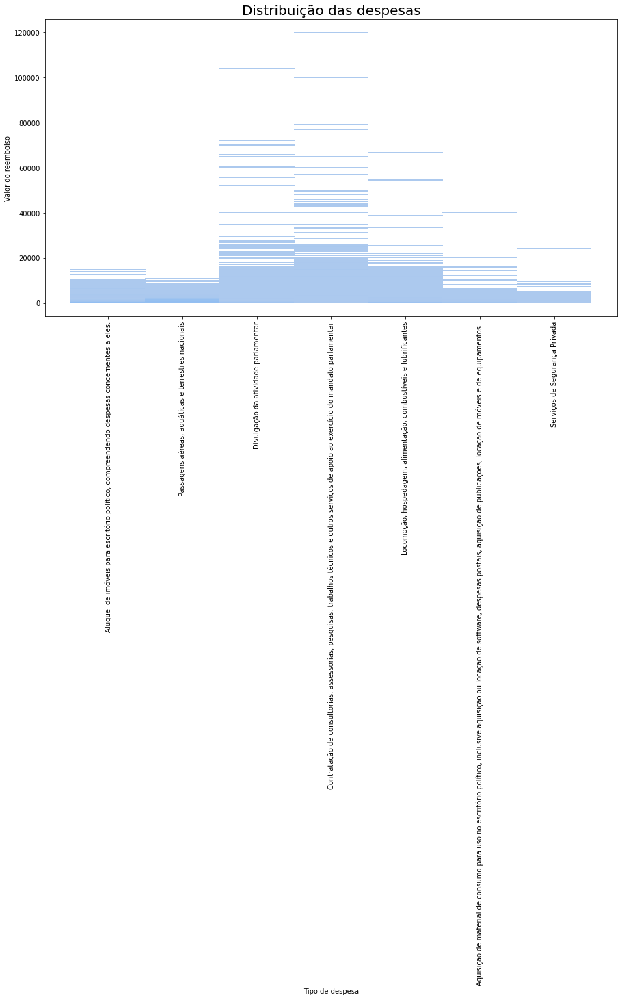

In [16]:
#valor_por_despesa = dataset_ceaps.groupby(['TIPO_DESPESA'])['VALOR_REEMBOLSADO'].agg('sum').round(2)

plt.figure(figsize=(15, 8))
ax = sns.histplot(data = dataset_ceaps, x = "TIPO_DESPESA", y='VALOR_REEMBOLSADO');
ax.set_title("Despesas")
plt.xlabel('Tipo de despesa')
plt.ylabel('Valor do reembolso')
plt.title('Distribuição das despesas', fontsize=20)
ax.tick_params(axis='x', rotation=90)
plt.show()

In [17]:
dataset_ceaps.SENADOR.value_counts()

WELLINGTON FAGUNDES     2730
HUMBERTO COSTA          2463
PAULO PAIM              2260
CARLOS VIANA            2062
JOSÉ SERRA              1954
                        ... 
JULIO VENTURA             13
BLAIRO MAGGI               6
SIQUEIRA CAMPOS            4
VIRGINIO DE CARVALHO       3
NAILDE PANTA               1
Name: SENADOR, Length: 168, dtype: int64

In [18]:
dataset_ceaps.groupby(['SENADOR'])['VALOR_REEMBOLSADO'].agg('sum').round(2)

SENADOR
ACIR GURGACZ              1742797.37
AIRTON SANDOVAL            308025.84
ALESSANDRO VIEIRA         1439011.85
ALEXANDRE SILVEIRA         150963.05
ALOYSIO NUNES FERREIRA      18450.05
                             ...    
ZENAIDE MAIA              1251084.91
ZEQUINHA MARINHO          1592732.22
ZEZÉ PERRELLA              320676.04
ZÉ SANTANA                  61979.10
ÂNGELA PORTELA             525218.29
Name: VALOR_REEMBOLSADO, Length: 168, dtype: float64

In [19]:
trace = go.Scatter(x = dataset_ceaps['SENADOR'],
                   y = dataset_ceaps['VALOR_REEMBOLSADO'],
                   mode = 'markers')
data = [trace]
py.iplot(data)

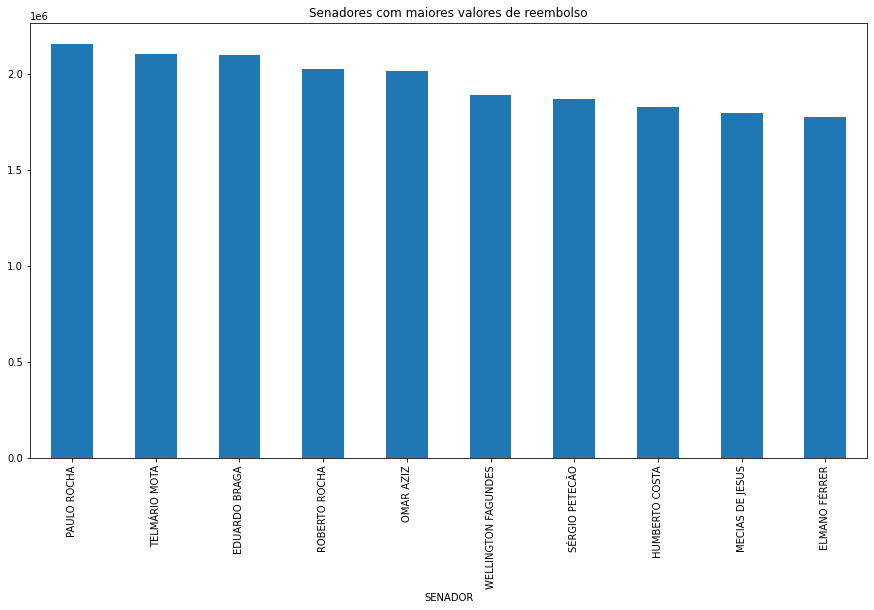

In [20]:
que_mais_pediram_reembolso = dataset_ceaps.groupby(['SENADOR'])['VALOR_REEMBOLSADO'].agg('sum').round(2)

que_mais_pediram_reembolso.sort_values(ascending=False).head(10).plot(kind='bar', 
                                                         title='Senadores com maiores valores de reembolso',
                                                         figsize=(15, 8));

In [21]:
dataset_ceaps.DATA.value_counts()

2018-05-02    159
2018-03-01    147
2018-08-01    146
2018-02-28    146
2018-04-02    146
             ... 
2017-12-31      1
2017-11-19      1
2017-11-28      1
2017-12-30      1
2022-10-12      1
Name: DATA, Length: 1776, dtype: int64

In [22]:
dataset_ceaps.groupby(['DATA'])['VALOR_REEMBOLSADO'].agg('sum').round(2)

DATA
2017-10-26      397.44
2017-11-14     1077.41
2017-11-15     2263.59
2017-11-16     2103.00
2017-11-19      528.09
                ...   
2022-10-08     2094.76
2022-10-09      227.62
2022-10-10    64409.73
2022-10-11    13451.13
2022-10-12      150.00
Name: VALOR_REEMBOLSADO, Length: 1776, dtype: float64

In [23]:
trace = go.Scatter(x = dataset_ceaps['DATA'],
                   y = dataset_ceaps['VALOR_REEMBOLSADO'],
                   mode = 'markers')
data = [trace]
py.iplot(data)

In [24]:
dataset_ceaps.MES.value_counts()

3     8840
5     8665
6     8074
7     7999
4     7991
2     7900
8     7883
10    6918
9     6833
11    6573
1     6017
12    5828
Name: MES, dtype: int64

In [25]:
dataset_ceaps.groupby(['MES'])['VALOR_REEMBOLSADO'].agg('sum').round(2)

MES
1      7979166.34
2      9744578.56
3     10846212.15
4      9831369.07
5     10381245.56
6      9886577.96
7      9557220.16
8      9688833.76
9      8619429.58
10     8939889.62
11     9268545.48
12    10542673.74
Name: VALOR_REEMBOLSADO, dtype: float64

In [26]:
trace = go.Bar(x = dataset_ceaps['MES'],
                   y = dataset_ceaps['VALOR_REEMBOLSADO'])
data = [trace]
py.iplot(data)

In [27]:
dataset_ceaps.ANO.value_counts()

2018    24410
2019    21628
2021    16823
2020    14088
2022    12572
Name: ANO, dtype: int64

In [28]:
dataset_ceaps.groupby(['ANO'])['VALOR_REEMBOLSADO'].agg('sum').round(2)

ANO
2018    25541441.53
2019    25238747.18
2020    20398423.60
2021    25016675.44
2022    19090454.23
Name: VALOR_REEMBOLSADO, dtype: float64

In [29]:
trace = go.Scatter(x = dataset_ceaps['ANO'],
                   y = dataset_ceaps['VALOR_REEMBOLSADO'],
                   mode = 'markers+lines')
data = [trace]
py.iplot(data)